In [18]:
# --- Bibliothèques standards de Python ---
import os
import time
import glob
from math import sqrt

# --- Bibliothèques scientifiques et de traitement d'images ---
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pywt
from scipy.signal.windows import hann
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

# --- Bibliothèques de Machine Learning et Deep Learning ---
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, ReLU, LeakyReLU, add, subtract
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
from numpy.lib.stride_tricks import as_strided

# --- Métrique d'évaluation avancée ---
import lpips
import torch

# --- Outils d'analyse ---
import pandas as pd

Paths: make sure that all yours images in clean_dir

In [19]:
clean_dir = "images/clean/"
noisy_dir = "images/noisy/"
output_dir = "images/denoised/"

Loading images:

+ Data Base:
    - Split the dataset into training, validation, and testing sets: 70% for training, 20% for testing and 10% for validations.
    

In [20]:

SEED = 42
print("Scanning the clean image database...")
all_clean_paths = sorted(glob.glob(os.path.join(clean_dir, "**/*.jpg"), recursive=True))

if not all_clean_paths:
    raise FileNotFoundError(f"No clean images found in '{clean_dir}'.")

print(f"{len(all_clean_paths)} clean images found.")

#--- Split the dataset into training, validation, and testing sets ---
train_paths, test_paths = train_test_split(all_clean_paths, test_size=0.2, random_state=SEED)
train_paths, val_paths = train_test_split(train_paths, test_size=0.125, random_state=SEED) # 0.125 * 0.8 = 0.1

print(f"\nDataset split into:")
print(f" - {len(train_paths)} images for training")
print(f" - {len(val_paths)} images for validation")
print(f" - {len(test_paths)} images for testing")

Scanning the clean image database...
1081 clean images found.

Dataset split into:
 - 756 images for training
 - 108 images for validation
 - 217 images for testing


Displaying sample clean images from the Train set:


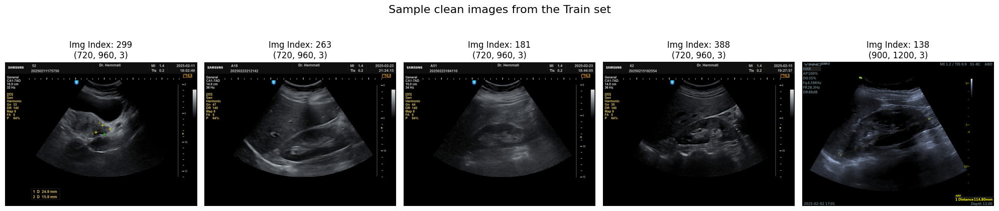

In [21]:
def visualize_random_samples(image_paths, num_images=5, title="Sample Images"):
    plt.figure(figsize=(20, 5))
    
    indices = np.random.choice(len(image_paths), num_images, replace=False)
    
    for i, idx in enumerate(indices):
        img_path = image_paths[idx]
        
        # Đọc ảnh bằng OpenCV
        img = cv2.imread(img_path)
        
        if img is None:
            print(f"Không thể đọc ảnh: {img_path}")
            continue
            
        # Convert color from BGR (OpenCV default) to RGB (for correct display with Matplotlib)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Plot image on grid
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img_rgb)
        plt.title(f"Img Index: {idx}\n{img_rgb.shape}") # Display image size for verification
        plt.axis("off")
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# --- Call the function to display ---
print("Displaying sample clean images from the Train set:")
visualize_random_samples(train_paths, num_images=5, title="Sample clean images from the Train set")

Data Pipeline

GPU Memory (VRAM): When training, Deep Learning stores not only the image, but also millions of parameters (weights) and dozens of intermediate transformation layers (feature maps).

A 720x960 image when fed into a CNN network can swell to several GB in VRAM. If not chopped, the GPU will immediately report an Out Of Memory (OOM) error.

Local feature learning: As explained, chopping helps the network focus on learning the detailed structure (texture) instead of trying to learn the overall layout.

Another problem is that when you train a deeplearning model, your inputs have to be of the same shape, and if you don't split them you need to reshape them. So it lost a lot of detail and it was also harder to return them to their original shape.

Clean Image -> Add Noise -> Noisy Image

Used a dataset of clean images and simulated real-world conditions by adding Gaussian Noise

I sliced images into small 256x256 patches

Initializing Data Pipeline...


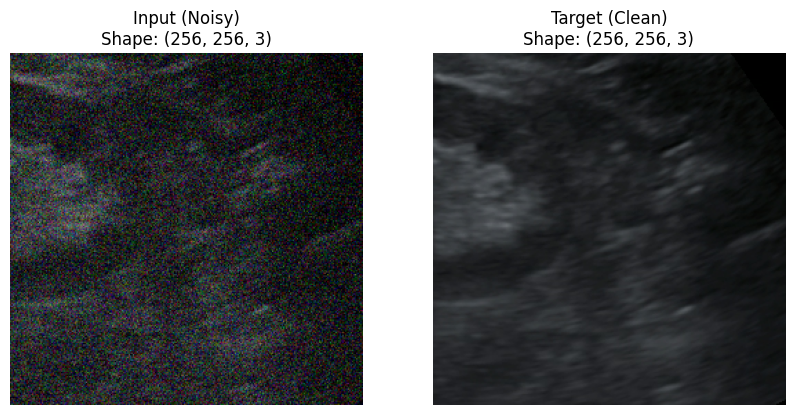

In [22]:
# --- Data Pipeline Parameters ---
PATCH_SIZE = 256   
BATCH_SIZE = 32    
NOISE_STD_DEV = 30/255.0  #  (sigma = 30)
BUFFER_SIZE = 1000 

def load_and_crop_image(path):

    image = tf.io.read_file(path)
    image = tf.io.decode_image(image, channels=3, expand_animations=False)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.random_crop(image, size=[PATCH_SIZE, PATCH_SIZE, 3])
    
    return image

def add_gaussian_noise(clean_image):

    noise = tf.random.normal(shape=tf.shape(clean_image), mean=0.0, stddev=NOISE_STD_DEV, dtype=tf.float32)
    noisy_image = clean_image + noise
    noisy_image = tf.clip_by_value(noisy_image, 0.0, 1.0)
    return noisy_image, clean_image

def prepare_dataset(file_paths, is_training=True):

    ds = tf.data.Dataset.from_tensor_slices(file_paths)
    ds = ds.map(load_and_crop_image, num_parallel_calls=tf.data.AUTOTUNE)
    if is_training:
        ds = ds.shuffle(buffer_size=BUFFER_SIZE)
    ds = ds.map(add_gaussian_noise, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(buffer_size=tf.data.AUTOTUNE)
    
    return ds

# ---  Dataset ---
print("Initializing Data Pipeline...")
train_ds = prepare_dataset(train_paths, is_training=True)
val_ds = prepare_dataset(val_paths, is_training=False)
test_ds = prepare_dataset(test_paths, is_training=False)

sample_noisy, sample_clean = next(iter(train_ds))

# Display
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title(f"Input (Noisy)\nShape: {sample_noisy[0].shape}")
plt.imshow(sample_noisy[0]) # Display the first image in the batch
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f"Target (Clean)\nShape: {sample_clean[0].shape}")
plt.imshow(sample_clean[0])
plt.axis('off')

plt.show()
#

In [23]:
def build_simple_autoencoder(input_shape=(256, 256, 3)):
    inputs = Input(shape=input_shape)
    
    # --- Encoder ---
    x = Conv2D(32, (3, 3), padding='same')(inputs)
    x = BatchNormalization()(x)
    x = LeakyReLU(negative_slope=0.2)(x)
    x = MaxPooling2D((2, 2), padding='same')(x) # 128 -> 64
    
    x = Conv2D(16, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(negative_slope=0.2)(x)
    
    # --- Decoder ---
    x = UpSampling2D((2, 2))(x) # 64 -> 128
    x = Conv2D(32, (3, 3), padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(negative_slope=0.2)(x)
    
    # Output layer: 3 filters for RGB image (instead of 1), sigmoid to [0, 1]
    outputs = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
    
    model = models.Model(inputs, outputs, name="Simple_Autoencoder")
    return model

# Initialize model
input_shape = (256, 256, 3) 
autoencoder = build_simple_autoencoder(input_shape)
autoencoder.summary()

Model: "Simple_Autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 128, 128, 16)   │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 128, 128, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 256, 256, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 256, 256, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 256, 256, 3)    │           867 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,347 (44.32 KB)

 Trainable params: 11,187 (43.70 KB)

 Non-trainable params: 160 (640.00 B)

In [ ]:
# Compile
autoencoder.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='mae', 
    metrics=['mse']
)

# Callbacks
callbacks = [
    EarlyStopping(patience=8, restore_best_weights=True, monitor='val_loss', verbose=1),
    ReduceLROnPlateau(patience=4, factor=0.5, verbose=1)
]

print("Start training Autoencoder...")
history_autoencoder = autoencoder.fit(
    train_ds,
    epochs=30, 
    validation_data=val_ds,
    callbacks=callbacks
)

Bắt đầu huấn luyện Autoencoder...
Epoch 1/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - loss: 0.2184 - mse: 0.0752 - val_loss: 0.3536 - val_mse: 0.1325 - learning_rate: 0.0010
Epoch 2/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - loss: 0.0301 - mse: 0.0023 - val_loss: 0.2948 - val_mse: 0.0925 - learning_rate: 0.0010
Epoch 3/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - loss: 0.0211 - mse: 0.0017 - val_loss: 0.2577 - val_mse: 0.0723 - learning_rate: 0.0010
Epoch 4/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - loss: 0.0200 - mse: 0.0016 - val_loss: 0.2002 - val_mse: 0.0466 - learning_rate: 0.0010
Epoch 5/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - loss: 0.0177 - mse: 0.0013 - val_loss: 0.1595 - val_mse: 0.0319 - learning_rate: 0.0010
Epoch 6/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - loss: 0.0164 - mse: 0.0012 - val_loss: 0.1265 - val_mse: 0.0212 - learning_rate: 0.0010
Epoch 7/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - loss: 0.0157 - mse: 0.0011 - val_loss: 0.1080 - val_mse: 0.0154 - learning

In [25]:
def reconstruct_from_patches_weighted(patches, image_shape, patch_size, stride):
    """
    Reconstructs an image from overlapping patches (weighted average).
    Supports 3-channel color images.
    """
    reconstructed = np.zeros(image_shape, dtype=np.float32)
    weight_map = np.zeros(image_shape, dtype=np.float32)
    
    # Hann window 2D
    window = hann(patch_size)
    window_2d = np.outer(window, window) 
    
    window_3d = window_2d[..., np.newaxis] 
    
    patch_idx = 0
    
    n_h = (image_shape[0] - patch_size) // stride + 1
    n_w = (image_shape[1] - patch_size) // stride + 1
    
    for i in range(n_h):
        for j in range(n_w):
            if patch_idx < len(patches):
                h_start = i * stride
                w_start = j * stride
                
                h_end = h_start + patch_size
                w_end = w_start + patch_size
                
                reconstructed[h_start:h_end, w_start:w_end, :] += patches[patch_idx] * window_3d
                weight_map[h_start:h_end, w_start:w_end, :] += window_3d
                
                patch_idx += 1
                
    reconstructed /= np.maximum(weight_map, 1e-8)
    
    return np.clip(reconstructed, 0, 1)

# Helper function to extract test image into patches
def extract_patches_sliding(image, patch_size, stride):
    patches = []
    h, w, c = image.shape
    n_h = (h - patch_size) // stride + 1
    n_w = (w - patch_size) // stride + 1
    
    for i in range(n_h):
        for j in range(n_w):
            h_start = i * stride
            w_start = j * stride
            patch = image[h_start:h_start+patch_size, w_start:w_start+patch_size, :]
            patches.append(patch)
    return np.array(patches)

In [26]:
loss_fn_alex = lpips.LPIPS(net='alex') 
if torch.cuda.is_available():
    loss_fn_alex = loss_fn_alex.cuda()

psnr_scores = []
ssim_scores = []
lpips_scores = []
times = []

print("Evaluating on Test set...")
test_images_count = 0
max_test_images = 100 

for batch_noisy, batch_clean in test_ds:
    if test_images_count >= max_test_images:
        break
        
    # Predict per batch
    start_t = time.time()
    preds = autoencoder.predict(batch_noisy, verbose=0)
    end_t = time.time()
    
    avg_time = (end_t - start_t) / batch_noisy.shape[0]
    
    batch_clean_np = batch_clean.numpy()
    preds_np = preds
    
    for i in range(len(batch_clean_np)):
        clean_img = batch_clean_np[i]
        denoised_img = preds_np[i]
        
        # 1. PSNR
        p = psnr(clean_img, denoised_img, data_range=1.0)
        psnr_scores.append(p)
        
        # 2. SSIM (specify channel_axis for color images)
        s = ssim(clean_img, denoised_img, data_range=1.0, channel_axis=-1)
        ssim_scores.append(s)
        

        t_clean = torch.from_numpy(clean_img).permute(2, 0, 1).unsqueeze(0).float() * 2 - 1
        t_denoised = torch.from_numpy(denoised_img).permute(2, 0, 1).unsqueeze(0).float() * 2 - 1
        
        if torch.cuda.is_available():
            t_clean = t_clean.cuda()
            t_denoised = t_denoised.cuda()
            
        with torch.no_grad():
            l_val = loss_fn_alex(t_clean, t_denoised)
        lpips_scores.append(l_val.item())
        
        times.append(avg_time)
        test_images_count += 1

results = {} 
results["Autoencoder_Patch"] = {
    "PSNR": np.mean(psnr_scores),
    "SSIM": np.mean(ssim_scores),
    "LPIPS": np.mean(lpips_scores),
    "Time (s)": np.mean(times)
}

results_df = pd.DataFrame.from_dict(results, orient='index')
display(results_df)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\TC\Desktop\TX_7860\.venv-tf\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\TC\Desktop\TX_7860\.venv-tf\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\TC\Desktop\TX_7860\.venv-tf\Lib\site-packages\lpips\weights\v0.1\alex.pth
Evaluating on Test set...


,PSNR,SSIM,LPIPS,Time (s)
Autoencoder_Patch,31.792172,0.8792,0.137452,0.011117


Number of patches to process: 24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


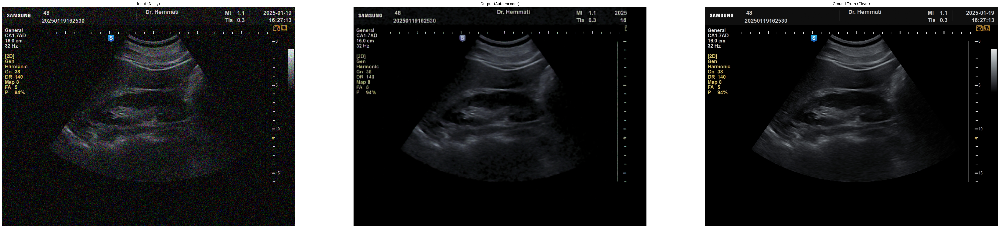

In [27]:
# Pick any clean image from the test set
sample_path = test_paths[3] 
full_clean_img = cv2.imread(sample_path)
full_clean_img = cv2.cvtColor(full_clean_img, cv2.COLOR_BGR2RGB).astype('float32') / 255.0

# Add noise to the full image
noise = np.random.normal(0, 30/255.0, full_clean_img.shape).astype('float32')
full_noisy_img = np.clip(full_clean_img + noise, 0, 1)


STRIDE = 128 

# 1. Extract patches
patches_noisy = extract_patches_sliding(full_noisy_img, 256, STRIDE)
print(f"Number of patches to process: {len(patches_noisy)}")

# 2.   (Predict)
denoised_patches = autoencoder.predict(patches_noisy, batch_size=32, verbose=1)

# 3.   (Reconstruct)
denoised_full_image = reconstruct_from_patches_weighted(
    denoised_patches, 
    full_noisy_img.shape, 
    256, 
    STRIDE
)

# 4. Display
plt.figure(figsize=(60, 20))
plt.subplot(1, 3, 1); plt.title("Input (Noisy)"); plt.imshow(full_noisy_img); plt.axis('off')
plt.subplot(1, 3, 2); plt.title("Output (Autoencoder)"); plt.imshow(denoised_full_image); plt.axis('off')
plt.subplot(1, 3, 3); plt.title("Ground Truth (Clean)"); plt.imshow(full_clean_img); plt.axis('off')
plt.show()

In [28]:
def conv_block(inputs, filters):
    """A standard convolutional block: Conv -> BN -> ReLU -> Conv -> BN -> ReLU"""
    x = Conv2D(filters, (3, 3), padding="same")(inputs)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    
    x = Conv2D(filters, (3, 3), padding="same")(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    return x

def build_unet(input_shape=(256, 256, 3)):
    inputs = Input(input_shape)

    # --- ENCODER (Downsampling) ---
    # Block 1
    c1 = conv_block(inputs, 32) # 32 filters
    p1 = MaxPooling2D((2, 2))(c1)

    # Block 2
    c2 = conv_block(p1, 64)     # 64 filters
    p2 = MaxPooling2D((2, 2))(c2)

    # --- BOTTLENECK (Bottom of the U) ---
    b = conv_block(p2, 128)     # 128 filters

    # --- DECODER (Upsampling + Skip Connections) ---
    # Block 3 (Up 1)
    u1 = UpSampling2D((2, 2))(b)
    u1 = concatenate([u1, c2])  
    c3 = conv_block(u1, 64)

    # Block 4 (Up 2)
    u2 = UpSampling2D((2, 2))(c3)
    u2 = concatenate([u2, c1])  
    c4 = conv_block(u2, 32)

    # --- OUTPUT ---
    outputs = Conv2D(3, (1, 1), activation='sigmoid')(c4) # 3 color channels, Sigmoid to [0,1]

    model = models.Model(inputs, outputs, name="Mini_UNet")
    return model

# Initialize model
unet = build_unet((256, 256, 3))
unet.summary()

Model: "Mini_UNet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 256, 256,  │        896 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_10 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 256, 256,  │      9,248 │ re_lu_10[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_11 (ReLU)     │ (None, 256, 256,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 128, 128,  │          0 │ re_lu_11[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 128, 128,  │     18,496 │ max_pooling2d_4[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_12 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 128, 128,  │     36,928 │ re_lu_12[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_13 (ReLU)     │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 64, 64,    │          0 │ re_lu_13[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 64, 64,    │     73,856 │ max_pooling2d_5[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_23[0][0] 

 Total params: 474,179 (1.81 MB)

 Trainable params: 472,899 (1.80 MB)

 Non-trainable params: 1,280 (5.00 KB)

In [29]:
# Compile model
unet.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='mae',  # MAE helps reduce blurriness compared to MSE
    metrics=['mse']
)

# Callbacks (Early stopping if no improvement to save time)
callbacks_unet = [
    EarlyStopping(patience=8, restore_best_weights=True, monitor='val_loss', verbose=1),
    ReduceLROnPlateau(patience=4, factor=0.5, verbose=1)
]

print("Training Mini U-Net...")
history_unet = unet.fit(
    train_ds,
    epochs=30, 
    validation_data=val_ds,
    callbacks=callbacks_unet
)

Training Mini U-Net...
Epoch 1/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 1174s 50s/step - loss: 0.2465 - mse: 0.0797 - val_loss: 0.3783 - val_mse: 0.1699 - learning_rate: 0.0010
Epoch 2/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 174s 7s/step - loss: 0.1481 - mse: 0.0306 - val_loss: 0.3512 - val_mse: 0.1788 - learning_rate: 0.0010
Epoch 3/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 178s 7s/step - loss: 0.0973 - mse: 0.0165 - val_loss: 0.2828 - val_mse: 0.1048 - learning_rate: 0.0010
Epoch 4/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 173s 7s/step - loss: 0.0671 - mse: 0.0092 - val_loss: 0.1169 - val_mse: 0.0177 - learning_rate: 0.0010
Epoch 5/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 361s 15s/step - loss: 0.0509 - mse: 0.0060 - val_loss: 0.0992 - val_mse: 0.0137 - learning_rate: 0.0010
Epoch 6/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 554s 23s/step - loss: 0.0383 - mse: 0.0038 - val_loss: 0.0836 - val_mse: 0.0102 - learning_rate: 0.0010
Epoch 7/30
24/24 ━━━━━━━━━━━━━━━━━━━━ 500s 21s/step - loss: 0.0295 - mse: 0.0028 - val_loss: 0.0819 - val_mse: 0.0094 - learnin

In [30]:
# Prepare a list containing points
psnr_unet, ssim_unet, lpips_unet, time_unet = [], [], [], []

print("Evaluating Mini U-Net on Test Set...")

test_count = 0
max_test = 100 

for batch_noisy, batch_clean in test_ds:
    if test_count >= max_test: break
    
    start_t = time.time()
    preds = unet.predict(batch_noisy, verbose=0)
    end_t = time.time()
    
    avg_time = (end_t - start_t) / batch_noisy.shape[0]
    
    batch_clean_np = batch_clean.numpy()
    
    for i in range(len(batch_clean_np)):
        clean_img = batch_clean_np[i]
        denoised_img = preds[i]
        
        # Calculate PSNR / SSIM
        psnr_unet.append(psnr(clean_img, denoised_img, data_range=1.0))
        ssim_unet.append(ssim(clean_img, denoised_img, data_range=1.0, channel_axis=-1))
        
        # Calculate LPIPS
        t_clean = torch.from_numpy(clean_img).permute(2, 0, 1).unsqueeze(0).float() * 2 - 1
        t_denoised = torch.from_numpy(denoised_img).permute(2, 0, 1).unsqueeze(0).float() * 2 - 1
        
        if torch.cuda.is_available():
            t_clean = t_clean.cuda()
            t_denoised = t_denoised.cuda()
            
        with torch.no_grad():
            lpips_unet.append(loss_fn_alex(t_clean, t_denoised).item())
            
        time_unet.append(avg_time)
        test_count += 1

# Update results in the common table
results["UNet"] = {
    "PSNR": np.mean(psnr_unet),
    "SSIM": np.mean(ssim_unet),
    "LPIPS": np.mean(lpips_unet),
    "Time (s)": np.mean(time_unet)
}

# Display the latest leaderboard
df_final = pd.DataFrame.from_dict(results, orient='index')
print("\n=== UPDATED LEADERBOARD ===")
display(df_final.sort_values(by="PSNR", ascending=False))

Evaluating Mini U-Net on Test Set...

=== UPDATED LEADERBOARD ===


,PSNR,SSIM,LPIPS,Time (s)
UNet,35.119724,0.872993,0.115857,0.063153
Autoencoder_Patch,31.792172,0.879200,0.137452,0.011117


Number of patches to process: 24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


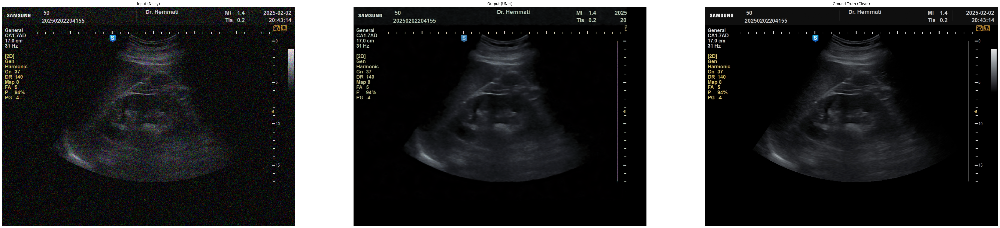

In [35]:
# Pick any clean image from the test set
sample_path = test_paths[0] 
full_clean_img1 = cv2.imread(sample_path)
full_clean_img1 = cv2.cvtColor(full_clean_img1, cv2.COLOR_BGR2RGB).astype('float32') / 255.0

# Add noise to the full image
noise1 = np.random.normal(0, 30/255.0, full_clean_img1.shape).astype('float32')
full_noisy_img1 = np.clip(full_clean_img1 + noise1, 0, 1)


STRIDE = 128 

# 1. Extract patches
patches_noisy = extract_patches_sliding(full_noisy_img1, 256, STRIDE)
print(f"Number of patches to process: {len(patches_noisy)}")

# 2.   (Predict)
denoised_patches = unet.predict(patches_noisy, batch_size=32, verbose=1)

# 3.   (Reconstruct)
denoised_full_image1 = reconstruct_from_patches_weighted(
    denoised_patches, 
    full_noisy_img1.shape, 
    256, 
    STRIDE
)

# 4. Display
plt.figure(figsize=(60, 20))
plt.subplot(1, 3, 1); plt.title("Input (Noisy)"); plt.imshow(full_noisy_img1); plt.axis('off')
plt.subplot(1, 3, 2); plt.title("Output (UNet)"); plt.imshow(denoised_full_image1); plt.axis('off')
plt.subplot(1, 3, 3); plt.title("Ground Truth (Clean)"); plt.imshow(full_clean_img1); plt.axis('off')
plt.show()

In [32]:
# Ensure input to these functions is uint8 image [0, 255]

def denoise_gaussian(img):
    return cv2.GaussianBlur(img, (5, 5), 0)

def denoise_median(img):
    return cv2.medianBlur(img, 5)

def denoise_bilateral(img):
    # Bilateral is very good at edge preservation
    return cv2.bilateralFilter(img, 9, 75, 75)

def denoise_nlm(img):
    # Note: Use fastNlMeansDenoisingColored for color images
    # h=10 is an important parameter (higher -> smoother but less detail)
    return cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)

def denoise_wavelet_channel(channel, wavelet='db1', level=2):
    # Subfunctions to process each color channel
    coeffs = pywt.wavedec2(channel, wavelet, level=level)
    sigma = np.median(np.abs(coeffs[-1][-1])) / 0.6745
    threshold = sigma * np.sqrt(2 * np.log(channel.size))
    
    coeffs_t = [coeffs[0]]
    for level_details in coeffs[1:]:
        thresholded_tuple = tuple(pywt.threshold(detail_array, threshold, mode='soft') for detail_array in level_details)
        coeffs_t.append(thresholded_tuple)
        
    img_denoised = pywt.waverec2(coeffs_t, wavelet)
    return img_denoised

def denoise_wavelet(img):
    # Process Wavelet for each R, G, B channel then merge
    channels = cv2.split(img)
    denoised_channels = []
    for c in channels:
        c_denoised = denoise_wavelet_channel(c)
        # Resize if size mismatches due to wavelet padding
        if c_denoised.shape != c.shape:
            c_denoised = cv2.resize(c_denoised, (c.shape[1], c.shape[0]))
        denoised_channels.append(c_denoised)
    
    result = cv2.merge(denoised_channels)
    return np.clip(result, 0, 255).astype(np.uint8)

# List of denoising methods
denoising_methods = {
    "Gaussian": denoise_gaussian,
    "Median": denoise_median,
    "Bilateral": denoise_bilateral,
    "NLM": denoise_nlm,
    "Wavelet": denoise_wavelet
}

In [33]:
NUM_TEST_IMAGES = 50
NOISE_SIGMA = 30     

# Chuẩn bị LPIPS
loss_fn_alex = lpips.LPIPS(net='alex')
if torch.cuda.is_available():
    loss_fn_alex = loss_fn_alex.cuda()

results_classical = {}

print(f"Evaluating classical methods on {NUM_TEST_IMAGES} images...")

# Randomly select test images
test_sample_paths = np.random.choice(test_paths, NUM_TEST_IMAGES, replace=False)

for name, func in denoising_methods.items():
    print(f"--> Running method: {name}")
    
    psnr_list, ssim_list, lpips_list, time_list = [], [], [], []
    
    for path in test_sample_paths:
        # 1. Read image and add noise
        clean_img = cv2.imread(path)
        clean_img = cv2.cvtColor(clean_img, cv2.COLOR_BGR2RGB) # RGB [0, 255]
        
        noise = np.random.normal(0, NOISE_SIGMA, clean_img.shape).astype(np.float32)
        noisy_img = np.clip(clean_img + noise, 0, 255).astype(np.uint8)
        
        # 2. Perform denoising and measure time
        start_time = time.time()
        denoised_img = func(noisy_img) # Input uint8 -> Output uint8
        end_time = time.time()
        
        # 3. Calculate metrics
        # PSNR
        p = psnr(clean_img, denoised_img, data_range=255)
        
        # SSIM
        s = ssim(clean_img, denoised_img, data_range=255, channel_axis=-1)
        
        # LPIPS (need to normalize to [-1, 1] and convert to Tensor)
        t_clean = torch.from_numpy(clean_img).permute(2, 0, 1).unsqueeze(0).float() / 127.5 - 1.0
        t_denoised = torch.from_numpy(denoised_img).permute(2, 0, 1).unsqueeze(0).float() / 127.5 - 1.0
        
        if torch.cuda.is_available():
            t_clean = t_clean.cuda()
            t_denoised = t_denoised.cuda()
            
        with torch.no_grad():
            l = loss_fn_alex(t_clean, t_denoised).item()
            
        psnr_list.append(p)
        ssim_list.append(s)
        lpips_list.append(l)
        time_list.append(end_time - start_time)
    
    # Save average results
    results_classical[name] = {
        "PSNR": np.mean(psnr_list),
        "SSIM": np.mean(ssim_list),
        "LPIPS": np.mean(lpips_list),
        "Time (s)": np.mean(time_list)
    }

df_classical = pd.DataFrame.from_dict(results_classical, orient='index')

if 'results' in globals():
    try:
        df_combined = pd.concat([df_classical, df_final]) 
    except:
        df_combined = df_classical
else:
    df_combined = df_classical

display(df_combined.sort_values(by="PSNR", ascending=False))

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\TC\Desktop\TX_7860\.venv-tf\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\TC\Desktop\TX_7860\.venv-tf\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\TC\Desktop\TX_7860\.venv-tf\Lib\site-packages\lpips\weights\v0.1\alex.pth
Evaluating classical methods on 50 images...
--> Running method: Gaussian
--> Running method: Median
--> Running method: Bilateral
--> Running method: NLM
--> Running method: Wavelet


,PSNR,SSIM,LPIPS,Time (s)
UNet,35.119724,0.872993,0.115857,0.063153
Autoencoder_Patch,31.792172,0.879200,0.137452,0.011117
Bilateral,27.620802,0.310696,0.352326,0.017252
Wavelet,24.948003,0.305174,0.488682,0.144270
Gaussian,24.824806,0.308769,0.545398,0.001178
Median,24.657486,0.543078,0.518740,0.005062
NLM,21.004073,0.122470,0.810356,0.628268


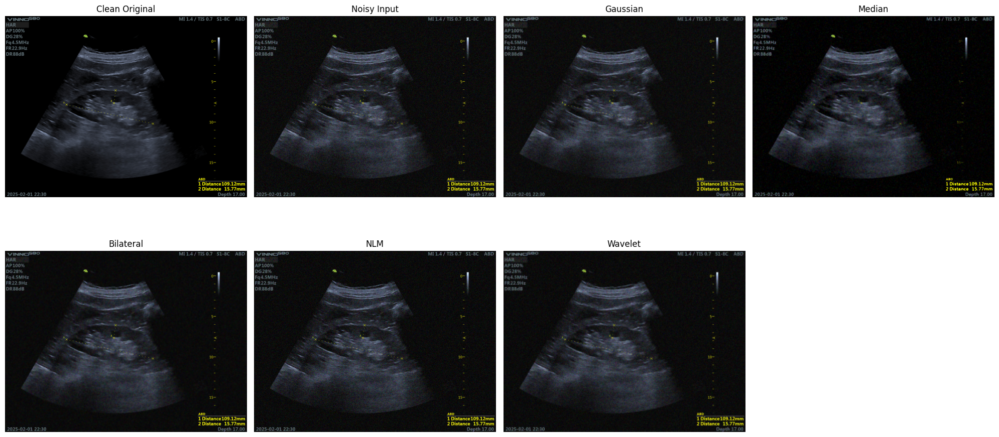

In [34]:
# Visual comparison on one sample image
sample_img = cv2.cvtColor(cv2.imread(test_sample_paths[0]), cv2.COLOR_BGR2RGB)
noise = np.random.normal(0, 30, sample_img.shape)
sample_noisy = np.clip(sample_img + noise, 0, 255).astype(np.uint8)

plt.figure(figsize=(20, 10))

# Original and noisy images
plt.subplot(2, 4, 1)
plt.imshow(sample_img); plt.title("Clean Original"); plt.axis('off')
plt.subplot(2, 4, 2)
plt.imshow(sample_noisy); plt.title("Noisy Input"); plt.axis('off')

# Classical methods
methods_list = list(denoising_methods.items())
for i, (name, func) in enumerate(methods_list):
    res = func(sample_noisy)
    plt.subplot(2, 4, i + 3)
    plt.imshow(res)
    plt.title(f"{name}")
    plt.axis('off')


plt.tight_layout()
plt.show()